<h1 style="font-size:40px;"><center>CovidGan VGG<br>
</center></h1>

## Objective
In this note, we design a generative network that generates new covid-Xrays to train AI in detecting covid. 

## Data
We use the data from http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html.

## Plan
1) Preprocess the data of 331/601 training samples (covid/normal) and 72/120 validation samples. View as RGB with 3 channels, even though the images are black and white.

2) Use VGG to train a discriminator. Does the accuracy reach 85 % approximately?

3) Use CovidGAN to generate 1669/1399 samples. Do not include the 72/120 in this process. 

4) Use VGG to train a discrimantor with the 2000/2000 dataset. Does the accuracy read 95 % approximately?

## 0) Setting up

In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision.models as models
import torchvision

# new

import matplotlib.pyplot as plt
import matplotlib.pyplot as plt1

from skimage import data, color
from skimage.transform import rescale, resize, downscale_local_mean


# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
dataroot_train = "data_for_hw/Train"
dataroot_valid = "data_for_hw/Valid"

# Number of workers for dataloader
workers = 1
batch_size = 64 # 64 in the article
image_size = 128

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100
num_epochs = 2000 # 2000 in the article

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1
n_classes=2
embedding_dim=100
latent_dim=100

## 1) Preprocessing

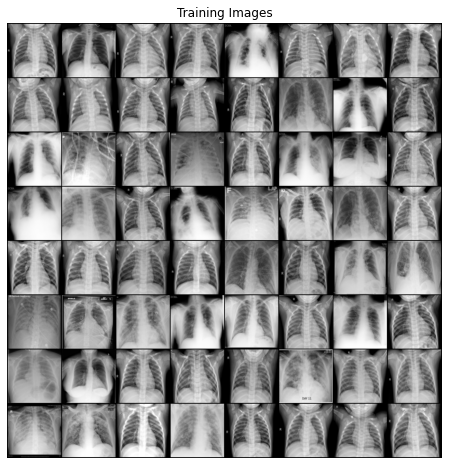

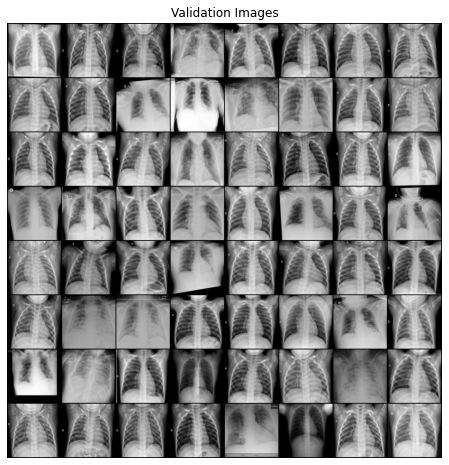

In [3]:
dataset_train = dset.ImageFolder(root=dataroot_train,
                           transform=transforms.Compose([
                               transforms.Resize(128),
                               transforms.CenterCrop(128),
                               transforms.ToTensor()
                           ]))
dataset_valid = dset.ImageFolder(root=dataroot_valid,
                           transform=transforms.Compose([
                               transforms.Resize(128),
                               transforms.CenterCrop(128),
                               transforms.ToTensor()
                           ]))


# Create the dataloader
dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)
dataloader_valid = torch.utils.data.DataLoader(dataset_valid, batch_size=192,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader_train))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

real_batch = next(iter(dataloader_valid))
plt1.figure(figsize=(8,8))
plt1.axis("off")
plt1.title("Validation Images")
plt1.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [21]:
print(dataset_train[0][0])
print(len(dataset_train))
print(len(dataset_valid))

tensor([[[0.1765, 0.0039, 0.0000,  ..., 0.0000, 0.0039, 0.1137],
         [0.0118, 0.0000, 0.0000,  ..., 0.0000, 0.0078, 0.0510],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0196, 0.0824],
         ...,
         [0.1882, 0.2824, 0.3961,  ..., 0.0235, 0.0000, 0.0039],
         [0.2471, 0.3098, 0.4235,  ..., 0.0118, 0.0039, 0.0392],
         [0.3569, 0.3451, 0.4431,  ..., 0.0078, 0.0078, 0.1922]],

        [[0.1765, 0.0039, 0.0000,  ..., 0.0000, 0.0039, 0.1137],
         [0.0118, 0.0000, 0.0000,  ..., 0.0000, 0.0078, 0.0510],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0196, 0.0824],
         ...,
         [0.1882, 0.2824, 0.3961,  ..., 0.0235, 0.0000, 0.0039],
         [0.2471, 0.3098, 0.4235,  ..., 0.0118, 0.0039, 0.0392],
         [0.3569, 0.3451, 0.4431,  ..., 0.0078, 0.0078, 0.1922]],

        [[0.1765, 0.0039, 0.0000,  ..., 0.0000, 0.0039, 0.1137],
         [0.0118, 0.0000, 0.0000,  ..., 0.0000, 0.0078, 0.0510],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0196, 0.

## 2) VGG training, part 1

In [22]:
vgg_model = models.vgg16(pretrained=True)
print(vgg_model.classifier)

del(vgg_model.classifier[1:7])
vgg_model.classifier[0]=nn.Linear(in_features=25088,out_features=1)
print(vgg_model.classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)
Sequential(
  (0): Linear(in_features=25088, out_features=1, bias=True)
)


In [3]:

class FinetuneVGG(nn.Module): # 128 x 128 size
    def __init__(self, pretrain):
        super().__init__() # super(FinetuneVGG, self).__init__()
        self.vgg = pretrain
    
    def forward(self, x):
        x = self.vgg(x)
        x = torch.sigmoid(x)
        return x.reshape((x.shape[0],))


In [24]:
for param in vgg_model.features.parameters():
    param.requires_grad = False

In [4]:
def output_to_label(z):
    """Map network output z to a hard label {0, 1}
    
    z (Tensor): Probabilities for each sample in a batch.
    """
    # YOUR CODE HERE
    
    for i in range(0,len(z)):
        z_temp=z[i]
        if z_temp>= 0.5:
            z[i]=1
        else:
            z[i]=0
    return z.to(torch.int64)
    
    
def test_output_to_label(fn):
    batch_size = torch.randint(1, 64, (1,))
    random_logits = torch.rand(batch_size)
    random_probs = random_logits / random_logits.sum()
    labels = fn(random_probs)
    assert labels.shape == random_logits.shape, "The element-wise function should preserve the shape"
    assert labels.dtype == torch.long, "Incorrect datatype, should be torch.long"
    fixed_logits = torch.tensor([0.1, 0.9, 0.51, 0.49, 0.7])
    fixed_labels = torch.tensor([0, 1, 1, 0, 1], dtype=torch.long)
    assert all(fixed_labels == fn(fixed_logits)), "Incorrect fixed output"


def training_loop(model, optimizer, loss_fn, train_loader, val_loader, num_epochs, print_every):
    print("Starting training")
    device = torch.device("cuda" if torch.cuda.is_available() 
                                  else "cpu")
    model.to(device)
    train_losses, train_accs, val_losses, val_accs = [], [], [], []

    for epoch in range(1, num_epochs+1):
        model, train_loss, train_acc = train_epoch(model,
                                                   optimizer,
                                                   loss_fn,
                                                   train_loader,
                                                   val_loader,
                                                   device, print_every) ### FR: added print_every
        val_loss, val_acc = validate(model, loss_fn, val_loader, device)
        print(f"Epoch {epoch}/{num_epochs}: "
              f"Train loss: {sum(train_loss)/len(train_loss):.3f}, "
              f"Train acc.: {sum(train_acc)/len(train_acc):.3f}, "
              f"Val. loss: {val_loss:.3f}, "
              f"Val. acc.: {val_acc:.3f}")
        train_losses.extend(train_loss)
        train_accs.extend(train_acc)
        val_losses.append(val_loss)
        val_accs.append(val_acc)
    return model, train_losses, train_accs, val_losses, val_accs

def train_epoch(model, optimizer, loss_fn, train_loader, val_loader, device, print_every): ### FR: added print_every
    # Train:
    train_loss_batches, train_acc_batches = [], []
    num_batches = len(train_loader)
    for batch_index, (x, y) in enumerate(train_loader, 1):
        inputs, labels = x.to(device), y.to(device)
        optimizer.zero_grad()
        z = model.forward(inputs)
        loss = loss_fn(z, labels.float())
        loss.backward()
        optimizer.step()
        train_loss_batches.append(loss.item())

        hard_preds = output_to_label(z)
        acc_batch_avg = (hard_preds == labels).float().mean().item()
        train_acc_batches.append(acc_batch_avg)

        # If you want to print your progress more often than every epoch you can
        # set `print_every` to the number of batches you want between every status update.
        # Note that the print out will trigger a full validation on the full val. set => slows down training
        if print_every is not None and batch_index % print_every == 0:
            val_loss, val_acc = validate(model, loss_fn, val_loader, device)
            model.train()
            print(f"\tBatch {batch_index}/{num_batches}: "
                  f"\tTrain loss: {sum(train_loss_batches[-print_every:])/print_every:.3f}, "
                  f"\tTrain acc.: {sum(train_acc_batches[-print_every:])/print_every:.3f}, "
                  f"\tVal. loss: {val_loss:.3f}, "
                  f"\tVal. acc.: {val_acc:.3f}")

    return model, train_loss_batches, train_acc_batches

def validate(model, loss_fn, val_loader, device):
    val_loss_cum = 0
    val_acc_cum = 0
    model.eval()
    with torch.no_grad():
        for batch_index, (x, y) in enumerate(val_loader, 1):
            inputs, labels = x.to(device), y.to(device)
            z = model.forward(inputs)

            batch_loss = loss_fn(z, labels.float())
            val_loss_cum += batch_loss.item()
            hard_preds = output_to_label(z)
            acc_batch_avg = (hard_preds == labels).float().mean().item()
            val_acc_cum += acc_batch_avg
    return val_loss_cum/len(val_loader), val_acc_cum/len(val_loader)

In [26]:
modelVGG= FinetuneVGG(vgg_model).to(device)

loss_fn = torch.nn.BCELoss()
optimizerVGG = optim.Adam(modelVGG.parameters(), lr=lr, betas=(beta1, 0.999))

modelVGG, train_losses_VGG, train_accs_VGG, val_losses_VGG, val_accs_VGG=training_loop(modelVGG, optimizerVGG, loss_fn, 
                                                                       dataloader_train, dataloader_valid, 20, None)

Starting training
Epoch 1/20: Train loss: 0.352, Train acc.: 0.825, Val. loss: 0.176, Val. acc.: 0.964
Epoch 2/20: Train loss: 0.166, Train acc.: 0.943, Val. loss: 0.144, Val. acc.: 0.958
Epoch 3/20: Train loss: 0.129, Train acc.: 0.958, Val. loss: 0.119, Val. acc.: 0.969
Epoch 4/20: Train loss: 0.109, Train acc.: 0.962, Val. loss: 0.118, Val. acc.: 0.964
Epoch 5/20: Train loss: 0.094, Train acc.: 0.970, Val. loss: 0.099, Val. acc.: 0.969
Epoch 6/20: Train loss: 0.082, Train acc.: 0.976, Val. loss: 0.103, Val. acc.: 0.958
Epoch 7/20: Train loss: 0.072, Train acc.: 0.979, Val. loss: 0.106, Val. acc.: 0.958
Epoch 8/20: Train loss: 0.063, Train acc.: 0.983, Val. loss: 0.094, Val. acc.: 0.958
Epoch 9/20: Train loss: 0.058, Train acc.: 0.982, Val. loss: 0.115, Val. acc.: 0.958
Epoch 10/20: Train loss: 0.054, Train acc.: 0.985, Val. loss: 0.093, Val. acc.: 0.958
Epoch 11/20: Train loss: 0.045, Train acc.: 0.989, Val. loss: 0.084, Val. acc.: 0.958
Epoch 12/20: Train loss: 0.041, Train acc.: 0

## 3) GAN, generate data

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.label_conditioned_generator=nn.Sequential(nn.Embedding(n_classes, embedding_dim),
                      nn.Linear(embedding_dim, 16))
        self.latent=nn.Sequential(nn.Linear(latent_dim, 4*4*512),
                                   nn.LeakyReLU(0.2, inplace=True))
        self.model=nn.Sequential(nn.ConvTranspose2d(513, 64*8, 4, 2, 1, bias=False),
                      nn.BatchNorm2d(64*8, momentum=0.1,  eps=0.8),
                      nn.ReLU(True),
                      nn.ConvTranspose2d(64*8, 64*4, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*4, momentum=0.1,  eps=0.8),
                      nn.ReLU(True),
                      nn.ConvTranspose2d(64*4, 64*2, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*2, momentum=0.1,  eps=0.8),
                      nn.ReLU(True),
                      nn.ConvTranspose2d(64*2, 64*1, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*1, momentum=0.1,  eps=0.8),
                      nn.ReLU(True),
                      nn.ConvTranspose2d(64*1, 3, 4, 2, 1, bias=False),
                      nn.Sigmoid())
 
    def forward(self, inputs):
        noise_vector, label = inputs
        label_output = self.label_conditioned_generator(label)
        label_output = label_output.view(-1, 1, 4, 4)
        latent_output = self.latent(noise_vector)
        latent_output = latent_output.view(-1, 512,4,4)
        concat = torch.cat((latent_output, label_output), dim=1)
        #print(concat.size())
        image = self.model(concat)
        #print(image.size())
        return image

torch.Size([3, 128, 128])


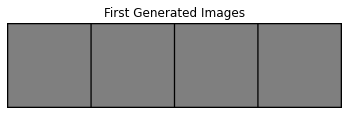

In [28]:
## Example of generation:

netG=Generator()

noise_vector = torch.randn(4, latent_dim) 
noise_vector = noise_vector
ll=torch.LongTensor([[0,0,1,1]])
generated_images = netG((noise_vector, ll))
print(generated_images[0].shape)
generated_images=generated_images.detach().numpy()
generated_images=torch.Tensor(generated_images)
plt.axis("off")
plt.title("First Generated Images")
grid_img = torchvision.utils.make_grid(generated_images)
plt.imshow(grid_img.permute(1, 2, 0))

In [6]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.label_condition_disc=nn.Sequential(nn.Embedding(n_classes, embedding_dim),
                      nn.Linear(embedding_dim, 3*128*128))
        self.model=nn.Sequential(nn.Conv2d(6, 64, 4, 2, 1, bias=False),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64, 64*2, 4, 3, 2, bias=False),
                      nn.BatchNorm2d(64*2, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64*2, 64*4, 4, 3,2, bias=False),
                      nn.BatchNorm2d(64*4, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64*4, 64*8, 4, 3, 2, bias=False),
                      nn.BatchNorm2d(64*8, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Flatten(),
                      nn.Dropout(0.4),
                      nn.Linear(4608, 1),
                      nn.Sigmoid()
                      )
 
    def forward(self, inputs):
        img, label = inputs
        label_output = self.label_condition_disc(label)
        label_output = label_output.view(-1, 3, 128, 128)
        concat = torch.cat((img, label_output), dim=1)
        #print(concat.size())
        output = self.model(concat)
        return output


In [30]:
criterion = nn.BCELoss()
criterion.requires_grad=True

netG=Generator()
netD=Discriminator()

netG.to(device)
netD.to(device)

real_label = 1.
fake_label = 0.

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [31]:
fixed_noise = torch.randn(64, latent_dim, device=device) # 
aa=torch.zeros((32,))
aa = aa.long()
aa=aa.reshape(1,aa.shape[0])
aa=torch.LongTensor(aa).to(device)
bb=torch.zeros((32,))+1
bb=bb.long()
bb=bb.reshape(1,bb.shape[0])
bb=torch.LongTensor(bb).to(device)
fixed_labels= torch.cat((aa,bb),dim=1)
fixed_inputs=(fixed_noise,fixed_labels)
print(fixed_inputs)

(tensor([[-0.4475,  0.9223, -0.2639,  ...,  1.4843, -1.3364, -0.4587],
        [ 0.5403,  1.9352, -1.4522,  ..., -0.7798,  1.4070,  0.6080],
        [ 1.0884,  0.2581, -0.3140,  ..., -0.0852, -0.0942, -0.1232],
        ...,
        [ 0.5986,  0.1860,  1.1233,  ...,  1.7229, -2.2232,  0.1713],
        [ 0.9386, -0.5993,  1.9525,  ...,  1.7342,  2.0181,  0.5793],
        [ 0.9584,  0.4961,  0.4912,  ..., -2.1729,  0.2063, -0.9878]],
       device='cuda:0'), tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], device='cuda:0'))


In [32]:
img_list = []
G_losses = []
D_losses = []
iters = 0

num_epochs = 1000 # 2000 #100
print("Starting Training Loop...")
for epoch in range(1, num_epochs+1):
    D_loss_list, G_loss_list = [], []
    for index, (real_images, labels) in enumerate(dataloader_train):
        optimizerD.zero_grad()
        real_images = real_images.to(device)
        #print(real_images.size(0))
        labels = labels.to(device)
        labels = labels.unsqueeze(1).long()
        real_target = Variable(torch.ones(real_images.size(0), 1).to(device))
        fake_target = Variable(torch.zeros(real_images.size(0), 1).to(device))
        D_real_loss = criterion(netD((real_images, labels)), real_target)  
        noise_vector = torch.randn(real_images.size(0), latent_dim, device=device) # torch.normal(0, 0.02, size=(real_images.size(0),latent_dim), device=device)
        noise_vector = noise_vector.to(device)

        generated_image = netG((noise_vector, labels))
        output = netD((generated_image.detach(), labels))
        D_fake_loss = criterion(output,  fake_target)

        # train with fake
        D_total_loss = (D_real_loss + D_fake_loss) / 2
        D_loss_list.append(D_total_loss)
        D_total_loss.backward()
        optimizerD.step()

        # Train generator with real labels
        optimizerG.zero_grad()
        G_loss = criterion(netD((generated_image, labels)), real_target)
        G_loss_list.append(G_loss)
        G_loss.backward()
        optimizerG.step()
        
        if epoch % 5 == 0 and index % 100 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\t'
                  % (epoch, num_epochs, index, len(dataloader_train),
                     D_total_loss.item(), G_loss.item()))

        # Save Losses for plotting later
        G_losses.append(G_loss.item())
        D_losses.append(D_total_loss.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if epoch % 50==1 and index ==0: # or ((epoch == num_epochs-1) and (index == len(dataloader_train)-1)):
            with torch.no_grad():
                fake = netG(fixed_inputs).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1



Starting Training Loop...
[5/1000][0/15]	Loss_D: 0.1320	Loss_G: 4.9329	
[10/1000][0/15]	Loss_D: 0.2877	Loss_G: 3.5947	
[15/1000][0/15]	Loss_D: 0.2484	Loss_G: 2.2120	
[20/1000][0/15]	Loss_D: 0.4546	Loss_G: 2.1358	
[25/1000][0/15]	Loss_D: 0.5306	Loss_G: 1.7957	
[30/1000][0/15]	Loss_D: 0.6366	Loss_G: 1.3050	
[35/1000][0/15]	Loss_D: 0.5491	Loss_G: 1.5432	
[40/1000][0/15]	Loss_D: 0.6269	Loss_G: 1.7549	
[45/1000][0/15]	Loss_D: 0.5383	Loss_G: 1.5679	
[50/1000][0/15]	Loss_D: 0.4830	Loss_G: 2.4677	
[55/1000][0/15]	Loss_D: 0.6164	Loss_G: 1.0537	
[60/1000][0/15]	Loss_D: 0.4985	Loss_G: 1.7134	
[65/1000][0/15]	Loss_D: 0.5332	Loss_G: 2.9196	
[70/1000][0/15]	Loss_D: 0.6201	Loss_G: 2.4130	
[75/1000][0/15]	Loss_D: 0.5006	Loss_G: 1.3010	
[80/1000][0/15]	Loss_D: 0.4437	Loss_G: 2.2768	
[85/1000][0/15]	Loss_D: 0.4528	Loss_G: 1.7807	
[90/1000][0/15]	Loss_D: 0.5649	Loss_G: 1.2353	
[95/1000][0/15]	Loss_D: 0.6297	Loss_G: 2.4385	
[100/1000][0/15]	Loss_D: 0.4786	Loss_G: 1.5457	
[105/1000][0/15]	Loss_D: 0.6104	Lo

[860/1000][0/15]	Loss_D: 0.0787	Loss_G: 8.8766	
[865/1000][0/15]	Loss_D: 0.0307	Loss_G: 6.0051	
[870/1000][0/15]	Loss_D: 0.0140	Loss_G: 6.4352	
[875/1000][0/15]	Loss_D: 0.0263	Loss_G: 7.6855	
[880/1000][0/15]	Loss_D: 0.0137	Loss_G: 7.8730	
[885/1000][0/15]	Loss_D: 0.0426	Loss_G: 7.7291	
[890/1000][0/15]	Loss_D: 0.0552	Loss_G: 7.2008	
[895/1000][0/15]	Loss_D: 0.0326	Loss_G: 8.8454	
[900/1000][0/15]	Loss_D: 0.0205	Loss_G: 6.8864	
[905/1000][0/15]	Loss_D: 0.0372	Loss_G: 7.0988	
[910/1000][0/15]	Loss_D: 0.0288	Loss_G: 8.0802	
[915/1000][0/15]	Loss_D: 0.0211	Loss_G: 7.5349	
[920/1000][0/15]	Loss_D: 0.0496	Loss_G: 7.4990	
[925/1000][0/15]	Loss_D: 0.0414	Loss_G: 5.8021	
[930/1000][0/15]	Loss_D: 0.0577	Loss_G: 5.8999	
[935/1000][0/15]	Loss_D: 0.0439	Loss_G: 7.2750	
[940/1000][0/15]	Loss_D: 0.0157	Loss_G: 6.8648	
[945/1000][0/15]	Loss_D: 0.0143	Loss_G: 7.1326	
[950/1000][0/15]	Loss_D: 0.0302	Loss_G: 7.2923	
[955/1000][0/15]	Loss_D: 0.0174	Loss_G: 6.7624	
[960/1000][0/15]	Loss_D: 0.0189	Loss_G: 

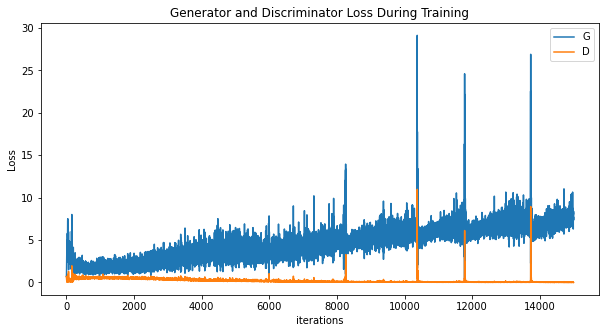

In [33]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

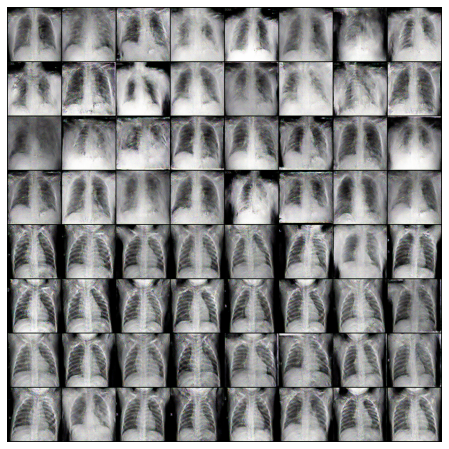

In [34]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [36]:
torch.save(netG.state_dict(), "netG_331_601_1000ep")
torch.save(netD.state_dict(), "netD_331_601_1000ep")

In [7]:
saved_netG = Generator().to(device)
saved_netG.load_state_dict(torch.load("netG_331_601_1000ep"))

saved_netD = Discriminator().to(device)
saved_netD.load_state_dict(torch.load("netD_331_601_1000ep"))

<All keys matched successfully>

In [8]:
netG=saved_netG
netD=saved_netD

In [9]:
from torchvision.utils import save_image

fixed_noise = torch.randn(1068, latent_dim, device=device) # 
aa=torch.zeros((669,))
aa = aa.long()
aa=aa.reshape(1,aa.shape[0])
aa=torch.LongTensor(aa).to(device)
bb=torch.zeros((399,))+1
bb=bb.long()
bb=bb.reshape(1,bb.shape[0])
bb=torch.LongTensor(bb).to(device)
fixed_labels= torch.cat((aa,bb),dim=1)
fixed_inputs=(fixed_noise,fixed_labels)
print(fixed_noise.shape)

generated_image = netG((fixed_inputs))

img2 = generated_image[5]
save_image(img2, 'img1.png')

torch.Size([1068, 100])


In [10]:
for i in range(generated_image.size(0)):
           torchvision.utils.save_image(generated_image[i, :, :, :], 'CovidGAN_{}.png'.format(i))

## 4) VGG training, part 2

In [9]:
dataroot_train = "data_for_hw/Train_w_Gen"
dataroot_valid = "data_for_hw/Valid"

dataset_train = dset.ImageFolder(root=dataroot_train,
                           transform=transforms.Compose([
                               transforms.Resize(128),
                               transforms.CenterCrop(128),
                               transforms.ToTensor()
                           ]))
dataset_valid = dset.ImageFolder(root=dataroot_valid,
                           transform=transforms.Compose([
                               transforms.Resize(128),
                               transforms.CenterCrop(128),
                               transforms.ToTensor()
                           ]))


device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

batch_size = 64
# Create the dataloader
dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)
dataloader_valid = torch.utils.data.DataLoader(dataset_valid, batch_size=64,
                                         shuffle=True, num_workers=workers)

In [10]:
vgg_model_gen = models.vgg16(pretrained=True)
print(vgg_model_gen.classifier)

del(vgg_model_gen.classifier[1:7])
vgg_model_gen.classifier[0]=nn.Linear(in_features=25088,out_features=1)
print(vgg_model_gen.classifier)

for param in vgg_model_gen.features.parameters():
    param.requires_grad = False

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)
Sequential(
  (0): Linear(in_features=25088, out_features=1, bias=True)
)


In [11]:
modelVGG= FinetuneVGG(vgg_model_gen).to(device)

loss_fn = torch.nn.BCELoss()
optimizerVGG = optim.Adam(modelVGG.parameters(), lr=lr, betas=(beta1, 0.999))

modelVGG, train_losses_VGG, train_accs_VGG, val_losses_VGG, val_accs_VGG=training_loop(modelVGG, optimizerVGG, loss_fn, 
                                                                       dataloader_train, dataloader_valid, 20, None)

Starting training
Epoch 1/20: Train loss: 0.237, Train acc.: 0.919, Val. loss: 0.128, Val. acc.: 0.964
Epoch 2/20: Train loss: 0.120, Train acc.: 0.961, Val. loss: 0.152, Val. acc.: 0.943
Epoch 3/20: Train loss: 0.089, Train acc.: 0.972, Val. loss: 0.076, Val. acc.: 0.979
Epoch 4/20: Train loss: 0.069, Train acc.: 0.979, Val. loss: 0.077, Val. acc.: 0.979
Epoch 5/20: Train loss: 0.059, Train acc.: 0.983, Val. loss: 0.116, Val. acc.: 0.948
Epoch 6/20: Train loss: 0.047, Train acc.: 0.990, Val. loss: 0.112, Val. acc.: 0.953
Epoch 7/20: Train loss: 0.040, Train acc.: 0.991, Val. loss: 0.086, Val. acc.: 0.964
Epoch 8/20: Train loss: 0.034, Train acc.: 0.994, Val. loss: 0.089, Val. acc.: 0.964
Epoch 9/20: Train loss: 0.030, Train acc.: 0.995, Val. loss: 0.090, Val. acc.: 0.964
Epoch 10/20: Train loss: 0.027, Train acc.: 0.996, Val. loss: 0.082, Val. acc.: 0.969
Epoch 11/20: Train loss: 0.023, Train acc.: 0.998, Val. loss: 0.086, Val. acc.: 0.969
Epoch 12/20: Train loss: 0.023, Train acc.: 0